# Panel section

### Install section

* URL : https://panel.pyviz.org/
* Open Conda Command
* Write this:
* conda install -c pyviz panel
* conda install -c conda-forge jupyterlab (support for Jupyter Lab)

### Tutorial - How to "Define a function by using Python"

* https://www.w3schools.com/python/python_functions.asp
* https://www.python-course.eu/functions.php
* https://www.geeksforgeeks.org/functions-in-python/

### General steps to use Panel

* 1. We have to import "panel", "pandas", "matplotlib.pyplot", and "numpy"
* 2. We have to define our function
* 3. We have to define the limit of our variables
* 4. Finally, we need to call Panel widget

### Examples

### Convert temperature from degree Celsius to Kelvin

Row
    [0] ParamFunction(function)
    [1] Column
        [0] Markdown(str)
        [1] FloatSlider(end=100, name='C', start=0, value=50)
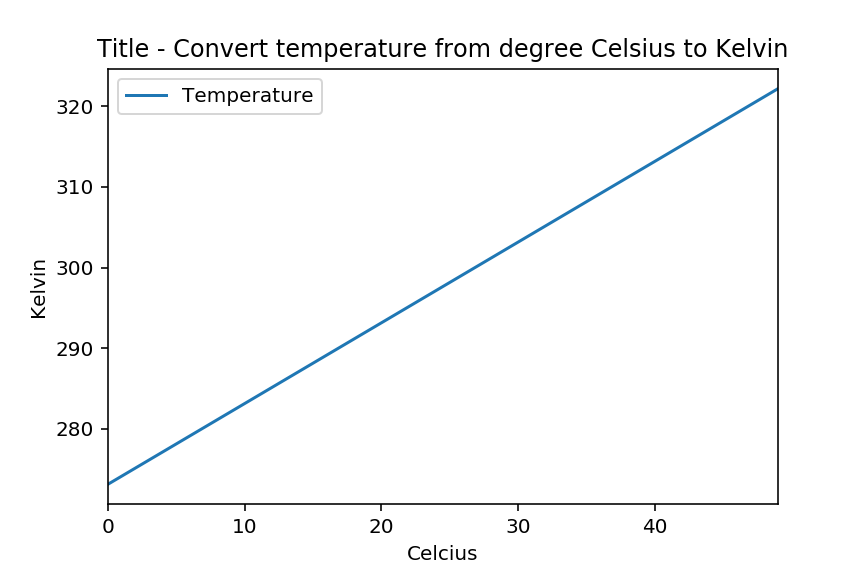

In [1]:
# First, we need to import Panel
import panel as pn
pn.extension()
import panel.widgets as pnw
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def mplplot(df, **kwargs):
    fig = df.plot(title='Title - Convert temperature from degree Celsius to Kelvin') #If you want to remove the legend use: legend=False
    fig.legend(["Temperature"]);
    fig.set_xlabel("Celcius")
    fig.set_ylabel("Kelvin")
    fig= fig.get_figure()
    plt.close(fig)
    return fig

# Second, we need to define our equation. In this case a function to convert temperature from degree Celsius to Kelvin.
def Celsius_to_Kelvin(C=100, view_fn=mplplot):
    C = np.arange(0,C, 1)    # We must define a range of values for us X axis. In this case Celcius values.
    K = (C + 273.15)
    df = pd.DataFrame(dict(y=K), index=C)
    
    return view_fn(df, K=K, C=C)

# The following section will help you to define the range of values of each variable.

C  = pnw.FloatSlider(name='C', value=50, start=0, end=100) #This is going to be the range of our varible.

@pn.depends(C.param.value)
def Celsius_to_Kelvin_variables(C):
    return Celsius_to_Kelvin(C)

widgets    = pn.Column("<br>\n#### Variable configuration", C)
Celsius_to_Kelvin_panel = pn.Row(Celsius_to_Kelvin_variables, widgets)

Celsius_to_Kelvin_panel   #Finally, we call Panel to use our function.

### Hydraulic conductivity - Darcy Law

#### Source: https://www.nrcs.usda.gov/wps/portal/nrcs/detail/soils/ref/?cid=nrcs142p2_053573

Row
    [0] ParamFunction(function)
    [1] Column
        [0] Markdown(str)
        [1] FloatSlider(end=86.4, name='Hydraulic conductivity (..., start=0.0015504535957425187, value=8.64)
        [2] FloatSlider(end=5, name='Area (m^2)', start=0.1, value=1)
        [3] FloatSlider(end=10, name='Second total h..., start=3, value=6)
        [4] FloatSlider(end=20, name='First total h..., start=3, value=10)
        [5] FloatSlider(end=10, name='Length (m)', start=1, value=5)
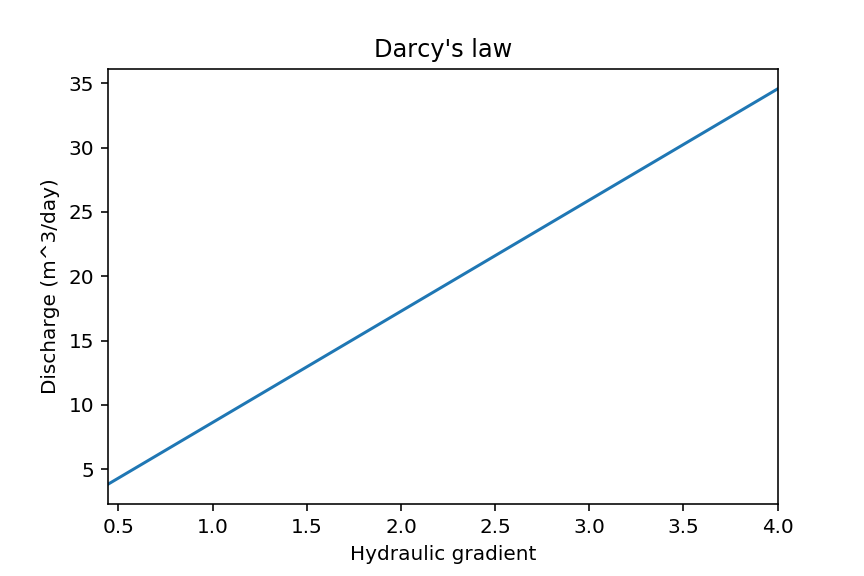

In [2]:
import panel as pn
pn.extension()
import panel.widgets as pnw
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def mplplot(df, **kwargs):
    fig = df.plot(title="Darcy's law", legend=False)
    fig.set_xlabel("Hydraulic gradient")
    fig.set_ylabel("Discharge (m^3/day)")
    fig= fig.get_figure()
    plt.close(fig)
    return fig

def darcy(K=8.64,A=0.1,h2=3,h1=4,L=5,view_fn=mplplot):
    
    L = np.arange(1,10,1)
    Q = - K * A * ((h2 - h1) / (L)) # Water flux
    H = - ((h2 - h1) / (L)) # Hydraulic gradient
    
    df = pd.DataFrame(dict(y=Q), index=H)
    
    return view_fn(df, K=K, A=A, h2=h2, h1=h1, L=L)

K  = pnw.FloatSlider(name='Hydraulic conductivity (m/d)', value=8.64, start=8.64**-3, end=86.4)
A  = pnw.FloatSlider(name='Area (m^2)', value=1, start=0.1, end=5)
h2  = pnw.FloatSlider(name='Second total hydraulic head (m)', value=6, start=3, end=10)
h1  = pnw.FloatSlider(name='First total hydraulic head (m)', value=10, start=3, end=20)
L  = pnw.FloatSlider(name='Length (m)', value=5, start=1, end=10)

@pn.depends(K.param.value, A.param.value, h2.param.value, h1.param.value, L.param.value)
def reactive_darcy(K,A,h2,h1,L):
    return darcy(K,A,h2,h1,L)

widgets    = pn.Column("<br>\n#### Soil temperature parameters", K,A,h2,h1,L)
darcy_panel = pn.Row(reactive_darcy, widgets)

darcy_panel

### Universal Soil Loss Equation (USLE)

#### Source: http://www.omafra.gov.on.ca/english/engineer/facts/12-051.htm

Row
    [0] ParamFunction(function)
    [1] Column
        [0] Markdown(str)
        [1] FloatSlider(end=120, name='R', start=90, value=100)
        [2] FloatSlider(end=0.46, name='K', start=0.01, value=0.15)
        [3] FloatSlider(end=10, name='slope', start=0, value=2.5)
        [4] FloatSlider(end=1000, name='slope_length', start=10, value=100)
        [5] FloatSlider(end=0.5, name='C', start=0.02, value=0.35)
        [6] FloatSlider(end=1, name='P', start=0.25, value=0.75)
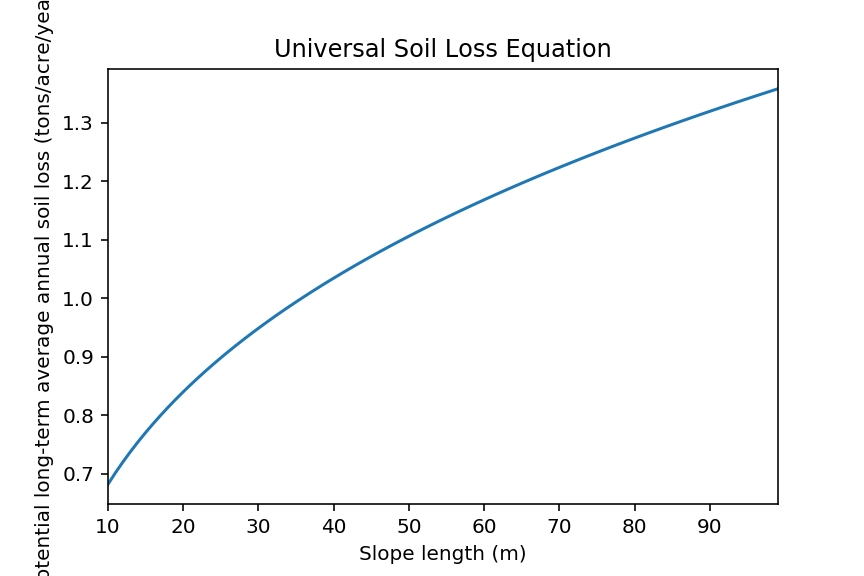

In [3]:
import panel as pn
pn.extension()
import panel.widgets as pnw
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def mplplot(df, **kwargs):
    fig = df.plot(title='Universal Soil Loss Equation', legend=False)
    fig.set_xlabel("Slope length (m)")
    fig.set_ylabel("Potential long-term average annual soil loss (tons/acre/year)")
    fig= fig.get_figure()
    plt.close(fig)
    return fig

def USLE(R=100,K=0.15,slope=2.5,slope_length=100,C=0.35,P=0.75, view_fn=mplplot):
    # R is the rainfall and runoff factor by geographic location, dimensionless (-)
    # K is the soil erodibility factor, tonnes/hectare (tons/acre)
    # C is the crop/vegetation and management factor, dimensionless (-)
    # P is the support practice factor, dimensionless (-)
    # LS is the slope length-gradient factor, dimensionless (-)
    

    slope_length = np.arange(10,slope_length,1)
    if slope < 1:
        LS = (0.065 + 0.0456*(slope) + 0.006541*(slope**2))*(slope_length / 22.1)**0.2 
    elif slope >= 1 and slope < 3:
        LS = (0.065 + 0.0456*(slope) + 0.006541*(slope**2))*(slope_length / 22.1)**0.3
    elif slope >= 3 and slope < 5:
        LS = (0.065 + 0.0456*(slope) + 0.006541*(slope**2))*(slope_length / 22.1)**0.4
    elif slope >= 5:
        LS = (0.065 + 0.0456*(slope) + 0.006541*(slope**2))*(slope_length / 22.1)**0.5
    
    A = R*K*LS*C*P
    df = pd.DataFrame(dict(y=A), index=slope_length)
    
    return view_fn(df, R=R,K=K,slope=slope,slope_length=slope_length,C=C,P=P)

R  = pnw.FloatSlider(name='R', value=100, start=90, end=120)
K  = pnw.FloatSlider(name='K', value=0.15, start=0.01, end=0.46)
slope  = pnw.FloatSlider(name='slope', value=2.5, start=0, end=10)
slope_length  = pnw.FloatSlider(name='slope_length', value=100, start=10, end=1000)
C  = pnw.FloatSlider(name='C', value=0.35, start=0.02, end=0.5) #Crop type, not Tillage Method factor
P  = pnw.FloatSlider(name='P', value=0.75, start=0.25, end=1)

@pn.depends(R.param.value, K.param.value, slope.param.value, slope_length.param.value, C.param.value, P.param.value)
def reactive_USLE(R,K,slope,slope_length,C,P):
    return USLE(R,K,slope,slope_length,C,P)

widgets    = pn.Column("<br>\n# USLE parameters", R,K,slope,slope_length,C,P)
USLE_panel = pn.Row(reactive_USLE, widgets)

USLE_panel

### Soil temperature equation developed by Kasuda

#### Source: 
* https://pdfs.semanticscholar.org/8453/9536ada01f9c008883ba7a5ec3cee2dbc662.pdf (equation)
* https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4813881/ (ground thermal diffusivity values)

Row
    [0] ParamFunction(function)
    [1] Column
        [0] Markdown(str)
        [1] FloatSlider(end=30, name='T_mean', start=1, value=18.5)
        [2] FloatSlider(end=30, name='T_amp', start=1, value=21)
        [3] FloatSlider(end=20, name='D', start=0, value=0)
        [4] FloatSlider(end=730, name='t_year', start=0, value=365)
        [5] FloatSlider(end=365, name='t_shift', start=0, value=35)
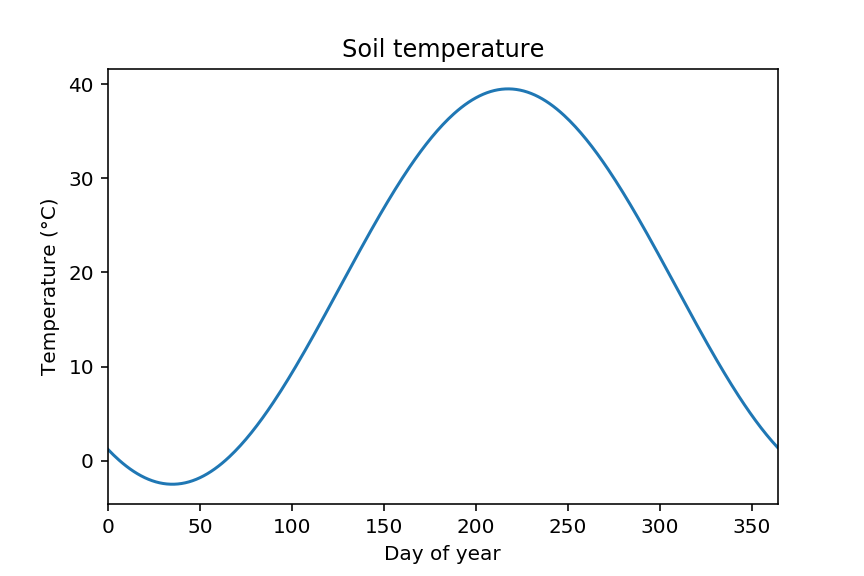

In [4]:
import panel as pn
pn.extension()
import panel.widgets as pnw
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def mplplot(df, **kwargs):
    fig = df.plot(title='Soil temperature', legend=False)
    fig.set_xlabel("Day of year")
    fig.set_ylabel("Temperature (°C)")
    fig= fig.get_figure()
    plt.close(fig)
    return fig

def soil_temp(T_mean=18.5,T_amp=21,D=20,t_year=365,t_shift=35,view_fn=mplplot):

#     T_soil(D,tyear) = Soil Temperature at depth D and Time of year
#     T_mean = Mean surface temperature (average air temperature). The temperature of the ground at an infinite depth will be this temperature, (°C)
#     T_amp = Amplitude of surface temperature [(maximum air temperature - minimum air temperature)/2], (°C)
#     D = Depth below the surface (surface=0), (m)
#     a = Thermal diffusivity of the ground (soil), (m^2/s)
#     t_year = current time, (day)
#     t_shift = day of the year of the minimum surface temperature, (day)

    t_year = np.arange(0,t_year,1)
    a = 0.0002
    
    
    T_soil=T_mean-(T_amp*np.exp(-D*np.sqrt(np.pi/(365*a)))*np.cos((2*np.pi/365)*(t_year-t_shift-(D/2)*np.sqrt(365/(np.pi*a)))))
    
    df = pd.DataFrame(dict(y=T_soil), index=t_year)
    
    return view_fn(df, T_mean=T_mean,T_amp=T_amp,D=D,t_year=t_year,t_shift=t_shift)

T_mean  = pnw.FloatSlider(name='T_mean', value=18.5, start=1, end=30)
T_amp  = pnw.FloatSlider(name='T_amp', value=21, start=1, end=30)
D  = pnw.FloatSlider(name='D', value=0, start=0, end=20)
t_year  = pnw.FloatSlider(name='t_year', value=365, start=0, end=730)
t_shift  = pnw.FloatSlider(name='t_shift', value=35, start=0, end=365)

@pn.depends(T_mean.param.value, T_amp.param.value, D.param.value, t_year.param.value, t_shift.param.value)
def reactive_soil_temp(T_mean,T_amp,D,t_year,t_shift):
    return soil_temp(T_mean,T_amp,D,t_year,t_shift)

widgets    = pn.Column("<br>\n#### Soil temperature parameters", T_mean,T_amp,D,t_year,t_shift)
soil_temp_panel = pn.Row(reactive_soil_temp, widgets)

soil_temp_panel

### Cooper and Jacob Solution for Confined Aquifers

#### Source: http://www.aqtesolv.com/cooper-jacob.htm

Row
    [0] ParamFunction(function)
    [1] Column
        [0] Markdown(str)
        [1] FloatSlider(end=5000, name='pumping rate', start=1000, value=2730)
        [2] FloatSlider(end=5000, name='transmissivity', start=1000, value=1250)
        [3] FloatSlider(end=86400, name='time', start=0, value=10800)
        [4] FloatSlider(end=730, name='radial distance f..., start=0, value=365)
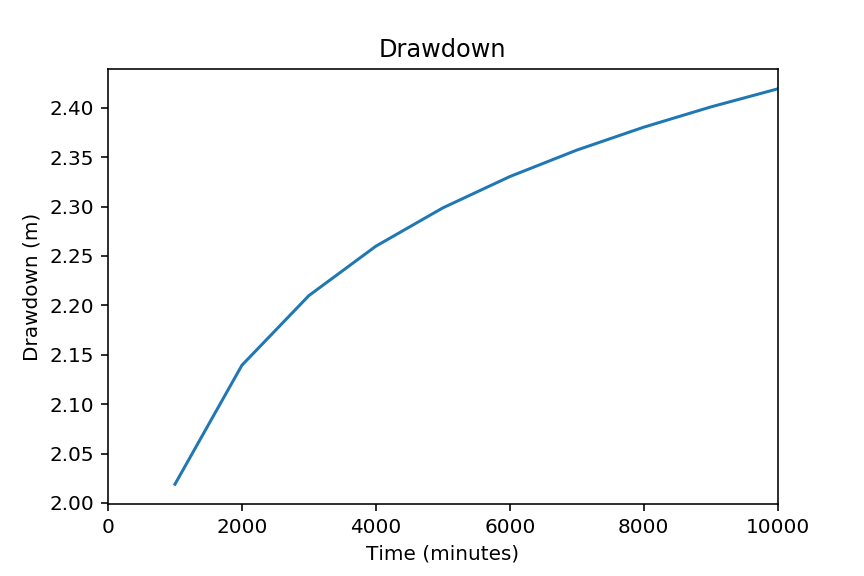

In [5]:
import panel as pn
pn.extension()
import panel.widgets as pnw
import pandas as pd
import numpy as np
np.seterr(divide='ignore', invalid='ignore')
import matplotlib.pyplot as plt

def mplplot(df, **kwargs):
    fig = df.plot(title='Drawdown', legend=False)
    fig.set_xlabel("Time (minutes)")
    fig.set_ylabel("Drawdown (m)")
    fig = fig.get_figure()
    plt.close(fig)
    return fig

def drawdown(Q=2730,T=1250,t=10800,r=122,view_fn=mplplot):
    
    # s = drawdown, (m)
    # Q = pumping rate, (m^3/d)
    # T = transmissivity, (m^2/d)
    # t = time, (seconds)
    # r = radial distance from pumping well, (m)
    # S = storage coefficient, (-)
    S=1.9*10**-4
    t = np.arange(0,t,1000)
    s = (Q/(4*np.pi*T))*np.log(2.2459*T*t/((r**2)*S))
    
    df = pd.DataFrame(dict(y=s), index=t)
    
    return view_fn(df, Q=Q,T=T,t=t,r=r)

Q = pnw.FloatSlider(name='pumping rate', value=2730, start=1000, end=5000)
T = pnw.FloatSlider(name='transmissivity', value=1250, start=1000, end=5000)
t = pnw.FloatSlider(name='time', value=10800, start=0, end=86400)
r = pnw.FloatSlider(name='radial distance from pumping well', value=365, start=0, end=730)

@pn.depends(Q.param.value, T.param.value, t.param.value, r.param.value)
def reactive_drawdown(Q,T,t,r):
    return drawdown(Q,T,t,r)

widgets    = pn.Column("<br>\n#### Cooper and Jacob parameters", Q,T,t,r)
drawdown_panel = pn.Row(reactive_drawdown, widgets)

drawdown_panel

### SCS runoff curve number method

#### Source: 
* https://www.nrcs.usda.gov/Internet/FSE_DOCUMENTS/stelprdb1044171.pdf
* https://edepot.wur.nl/183157

Row
    [0] ParamFunction(function)
    [1] Column
        [0] Markdown(str)
        [1] FloatSlider(end=100, name='Curve Number value, (-)', start=0, value=70)
        [2] FloatSlider(end=50, name='Precipitation, (mm)', start=1, value=7)
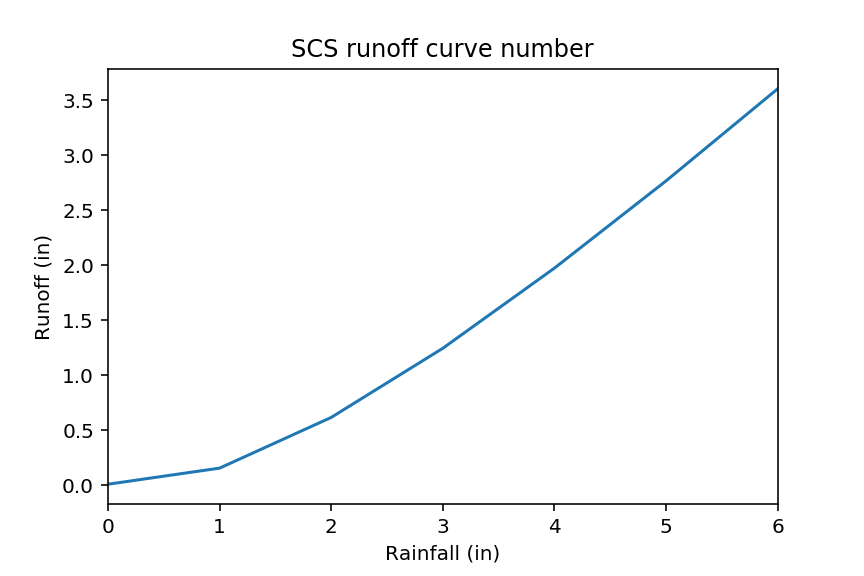

In [6]:
import panel as pn
pn.extension()
import panel.widgets as pnw
import pandas as pd
import numpy as np
np.seterr(divide='ignore', invalid='ignore')
import matplotlib.pyplot as plt

def mplplot(df, **kwargs):
    fig = df.plot(title='SCS runoff curve number', legend=False)
    fig.set_xlabel("Rainfall (in)")
    fig.set_ylabel("Runoff (in)")
    fig = fig.get_figure()
    plt.close(fig)
    return fig

def scs_runoff(CN=70,P=7,view_fn=mplplot):
    
    # Q = accumulated runoff depth, (in)
    # P = accumulated rainfall depth, (in) 
    # I = initial abstraction, (in)
    # S = potential maximum retention, (in) 
    
    P = np.arange(0,P,1)
    S = (1000/CN) - 10
    I = 0.2*S
    
    Q = ((P-0.2*I)**2) / (P + (0.8*S))
    
    df = pd.DataFrame(dict(y=Q), index=P)
    
    return view_fn(df, CN=CN, P=P)

CN = pnw.FloatSlider(name='Curve Number value, (-)', value=70, start=0, end=100)
P = pnw.FloatSlider(name='Precipitation, (mm)', value=7, start=1, end=50)

@pn.depends(CN.param.value, P.param.value)
def reactive_scs_runoff(CN,P):
    return scs_runoff(CN,P)

widgets    = pn.Column("<br>\n#### SCS runoff number parameters", CN,P)
scs_runoff_panel = pn.Row(reactive_scs_runoff, widgets)

scs_runoff_panel

### Streamflow depletion by well

#### Source: https://pubs.usgs.gov/of/2008/1166/pdf/ofr2008-1166_web.pdf (page 11)

C:\Users\hecto\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:42: RuntimeWarning: overflow encountered in exp
C:\Users\hecto\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:50: RuntimeWarning: overflow encountered in exp


Row
    [0] ParamFunction(function)
    [1] Column
        [0] Markdown(str)
        [1] FloatSlider(end=10, name='K', start=1.0, value=1)
        [2] FloatSlider(end=1, name='Ks', start=0.001, value=1)
        [3] FloatSlider(end=20, name='Qw', start=5, value=10)
        [4] FloatSlider(end=2000, name='d', start=100, value=500)
        [5] FloatSlider(end=500, name='t_start_recovery', start=1, value=150)
        [6] FloatSlider(end=500, name='t_end', start=1, value=365)
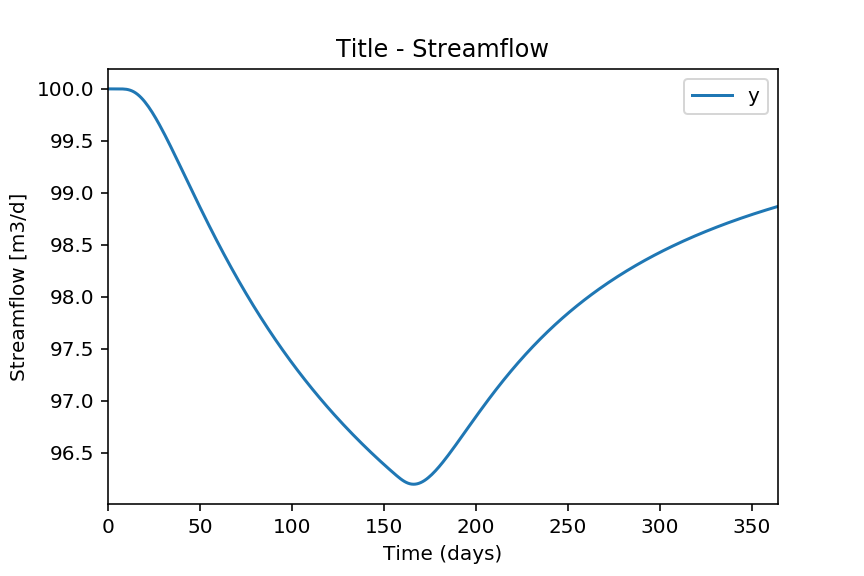

In [7]:
import panel as pn
pn.extension()
import panel.widgets as pnw
import numpy as np
np.seterr(divide='ignore', invalid='ignore')
import math
import pandas as pd
from scipy import special
import matplotlib.pyplot as plt


def mplplot(df, **kwargs):
    fig = df.plot(title='Title - Streamflow') #If you want to remove the legend use: legend=False
    fig.set_xlabel("Time (days)")
    fig.set_ylabel("Streamflow [m3/d]")
    fig= fig.get_figure()
    plt.close(fig)
    return fig
                         
def stream(K=1, Ks=1, Qw=10, d=200, t_start_recovery = 150, t_end=365, view_fn=mplplot):
            
    if t_start_recovery>t_end:
        t_start_recovery=t_end

    t_steps = np.arange(0,t_end, 1)     

    b = 100               
    bs = 1                
    s = .001             
    Qs0 = 100            
    Qs = np.zeros([np.shape(t_steps)[0]])
    S = s*b                     
    T = K*b                   
    a = K*bs/Ks                 

    tcount = -1
    for t in t_steps:
        tcount += 1
        w = np.sqrt(T*t/S)/a
        U = np.sqrt(d**2*S/(4*T*t))
        Qs_rel1 = special.erfc(U)
        Qs_rel2 = np.exp(-U**2+(U+w)**2)
        Qs_rel2 = np.nan_to_num(Qs_rel2)
        Qs_rel3 = special.erfc(U+w)
        Qtemp=Qs0-Qw*(Qs_rel1-Qs_rel2*Qs_rel3)
        if t>t_start_recovery:           
            w = np.sqrt(T*(t-t_start_recovery)/S)/a
            U = np.sqrt(d**2*S/(4*T*(t-t_start_recovery)))
            Qs_rel1 = special.erfc(U)
            Qs_rel2 = np.exp(-U**2+(U+w)**2)
            Qs_rel2 = np.nan_to_num(Qs_rel2)
            Qs_rel3 = special.erfc(U+w)
            Qtemp=Qtemp+Qw*(Qs_rel1-Qs_rel2*Qs_rel3)
        Qs[tcount] = Qtemp
    
    
    df = pd.DataFrame(dict(y=Qs), index=t_steps)
    
    
    return view_fn(df, K=K, Ks=Ks, Qw=Qw, d=d, t_start_recovery = t_start_recovery, t_end=t_end)

K  = pnw.FloatSlider(name='K', value=1, start=1.0, end=10)
Ks  = pnw.FloatSlider(name='Ks', value=1, start=0.001, end=1)
Qw  = pnw.FloatSlider(name='Qw', value=10, start=5, end=20)
d  = pnw.FloatSlider(name='d', value=500, start=100, end=2000)
t_start_recovery  = pnw.FloatSlider(name='t_start_recovery', value=150, start=1, end=500)
t_end  = pnw.FloatSlider(name='t_end', value=365, start=1, end=500)

@pn.depends(K.param.value, Ks.param.value, Qw.param.value, d.param.value, t_start_recovery.param.value, t_end.param.value)
def reactive_stream(K, Ks, Qw, d, t_start_recovery, t_end):
    return stream(K, Ks, Qw, d, t_start_recovery, t_end)

widgets    = pn.Column("<br>\n# Streamflow depletion parameters", K, Ks, Qw, d,t_start_recovery, t_end)
stream_panel = pn.Row(reactive_stream, widgets)

stream_panel